In [55]:
# First let's import the packages we will use in this project
# You can do this all now or as you need them
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None



# Now we need to read in the data
df = pd.read_csv(r'movies.csv')


In [26]:
# Now let's take a look at the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [27]:
# We need to see if we have any missing data
# Let's loop through the data and see if there is anything missing

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [28]:
df.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

Cleaning up the data

Budget and Gross both have null values.

Column Budget has 2171 null values, gross 189


In [29]:
# Cleaning the Budget Column by adding the mean() to the blank Values

mean_b = df["budget"].mean()
print(mean_b)
df["budget"].fillna(mean_b, inplace = True)

35589876.192650534


In [30]:
# Checking if the Budget Column is now populated (No blank Values)

df.isnull().sum()

name          0
rating       77
genre         0
year          0
released      2
score         3
votes         3
director      0
writer        3
star          1
country       3
budget        0
gross       189
company      17
runtime       4
dtype: int64

In [31]:
# Cleaning the Budget Column by adding the mean() to the blank Values
mean_g = df["gross"].mean()
print(mean_g)
df["gross"].fillna(mean_b, inplace = True)
df.isnull().sum()

78500541.01778312


name         0
rating      77
genre        0
year         0
released     2
score        3
votes        3
director     0
writer       3
star         1
country      3
budget       0
gross        0
company     17
runtime      4
dtype: int64

In [32]:
# Replacing the blank Score, votes values with the mean

mean_sc = df["score"].mean()
mean_v = df["votes"].mean()
print(mean_sc, mean_v)
df["score"].fillna(mean_sc, inplace = True)
df["votes"].fillna(mean_v, inplace = True)
df.isnull().sum()

6.390410958904109 88108.50476190477


name         0
rating      77
genre        0
year         0
released     2
score        0
votes        0
director     0
writer       3
star         1
country      3
budget       0
gross        0
company     17
runtime      4
dtype: int64

## Replacing the blank values of the company column with "Unknown Company"


In [33]:
# Data Types for our columns
#df["company"].unique()

df["company"].fillna("Unknown Company", inplace = True)
df.isnull().sum()

name         0
rating      77
genre        0
year         0
released     2
score        0
votes        0
director     0
writer       3
star         1
country      3
budget       0
gross        0
company      0
runtime      4
dtype: int64

In [34]:
df["rating"].unique()

array(['R', 'PG', 'G', nan, 'Not Rated', 'NC-17', 'Approved', 'TV-PG',
       'PG-13', 'Unrated', 'X', 'TV-MA', 'TV-14'], dtype=object)

In [35]:
df["rating"].fillna("Not Rated", inplace = True)
df.isnull().sum()

name        0
rating      0
genre       0
year        0
released    2
score       0
votes       0
director    0
writer      3
star        1
country     3
budget      0
gross       0
company     0
runtime     4
dtype: int64

In [36]:
df['released'].unique()

array(['June 13, 1980 (United States)', 'July 2, 1980 (United States)',
       'June 20, 1980 (United States)', ...,
       'October 23, 2020 (United States)', 'April 27, 2020 (Cameroon)',
       'August 19, 2020 (United States)'], dtype=object)

In [37]:
df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')

In [14]:
print(df.dtypes)

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
runtime     float64
dtype: object


In [38]:
## Dropping comumns Writer, runtime and released

df.drop(["runtime", "released"], axis = 1, inplace = True)

In [39]:
df.isnull().sum()

name        0
rating      0
genre       0
year        0
score       0
votes       0
director    0
writer      3
star        1
country     3
budget      0
gross       0
company     0
dtype: int64

## Replacing the missing Country Names with value "Unknown Country"

In [17]:
df["country"].fillna("Unknown Country", inplace = True)
df.isnull().sum()

name        0
rating      0
genre       0
year        0
score       0
votes       0
director    0
writer      3
star        1
country     0
budget      0
gross       0
company     0
dtype: int64

In [40]:
df["star"].unique()

df["star"].fillna("Unknown Star", inplace = True)
df.isnull().sum()

name        0
rating      0
genre       0
year        0
score       0
votes       0
director    0
writer      3
star        0
country     3
budget      0
gross       0
company     0
dtype: int64

In [41]:
df["writer"].unique()

df["writer"].fillna("Unknown Writer", inplace = True)
df.isnull().sum()

name        0
rating      0
genre       0
year        0
score       0
votes       0
director    0
writer      0
star        0
country     3
budget      0
gross       0
company     0
dtype: int64

In [42]:
df["votes"] = df["votes"].astype("int64")
df.head()

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company
0,The Shining,R,Drama,1980,8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.
1,The Blue Lagoon,R,Adventure,1980,5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm
3,Airplane!,PG,Comedy,1980,7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures
4,Caddyshack,R,Comedy,1980,7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures


In [43]:
print(df.dtypes)

name         object
rating       object
genre        object
year          int64
score       float64
votes         int64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
dtype: object


In [44]:
df.isnull().sum()

name        0
rating      0
genre       0
year        0
score       0
votes       0
director    0
writer      0
star        0
country     3
budget      0
gross       0
company     0
dtype: int64

In [45]:
df.dtypes

name         object
rating       object
genre        object
year          int64
score       float64
votes         int64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
dtype: object

## Sorting the Dataset by "Gross"

In [48]:
df.sort_values(by=['gross'], inplace = False, ascending=False)

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company
5445,Avatar,PG-13,Action,2009,7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox
7445,Avengers: Endgame,PG-13,Action,2019,8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios
3045,Titanic,PG-13,Drama,1997,7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm
7244,Avengers: Infinity War,PG-13,Action,2018,8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3818,"Love, Honor and Obey",R,Comedy,2000,6.5,5200,Dominic Anciano,Dominic Anciano,Sadie Frost,United Kingdom,35589876,1400,British Broadcasting Corporation (BBC)
7625,The Untold Story,Not Rated,Comedy,2019,5.7,320,Shane Stanley,Lee Stanley,Miko Hughes,United States,35589876,790,Visual Arts Entertainment
7580,Run with the Hunted,Not Rated,Crime,2019,5.2,735,John Swab,John Swab,Ron Perlman,United States,35589876,682,Roxwell Films
2417,Madadayo,Not Rated,Drama,1993,7.3,5100,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,596,DENTSU Music And Entertainment


## Setting Options to view all the Data

In [52]:
pd.set_option('display.max_row', None)
df

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company
0,The Shining,R,Drama,1980,8.400000,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.
1,The Blue Lagoon,R,Adventure,1980,5.800000,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.700000,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm
3,Airplane!,PG,Comedy,1980,7.700000,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures
4,Caddyshack,R,Comedy,1980,7.300000,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures
5,Friday the 13th,R,Horror,1980,6.400000,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures
6,The Blues Brothers,R,Action,1980,7.900000,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures
7,Raging Bull,R,Biography,1980,8.200000,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions
8,Superman II,PG,Action,1980,6.800000,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films
9,The Long Riders,R,Biography,1980,7.000000,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists


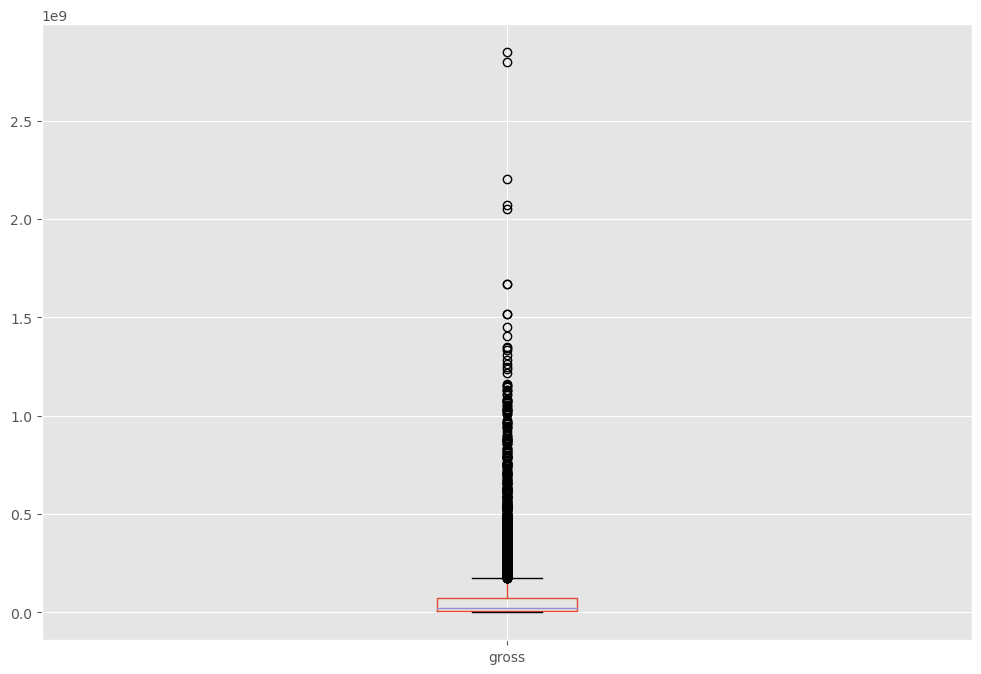

In [46]:
# Are there any Outliers?

df.boxplot(column=['gross']);

In [70]:
df.drop_duplicates()

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company
0,The Shining,R,Drama,1980,8.400000,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.
1,The Blue Lagoon,R,Adventure,1980,5.800000,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.700000,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm
3,Airplane!,PG,Comedy,1980,7.700000,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures
4,Caddyshack,R,Comedy,1980,7.300000,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,Not Rated,Drama,2020,3.100000,18,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000,35589876,Unknown Company
7664,Dream Round,Not Rated,Comedy,2020,4.700000,36,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,35589876,35589876,Cactus Blue Entertainment
7665,Saving Mbango,Not Rated,Drama,2020,5.700000,29,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,35589876,Embi Productions
7666,It's Just Us,Not Rated,Drama,2020,6.390411,88108,James Randall,James Randall,Christina Roz,United States,15000,35589876,Unknown Company


In [71]:
# Order our Data a little bit to see

df.sort_values(by=['gross'], inplace=False, ascending=False)


,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company
5445,Avatar,PG-13,Action,2009,7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox
7445,Avengers: Endgame,PG-13,Action,2019,8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios
3045,Titanic,PG-13,Drama,1997,7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm
7244,Avengers: Infinity War,PG-13,Action,2018,8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3818,"Love, Honor and Obey",R,Comedy,2000,6.5,5200,Dominic Anciano,Dominic Anciano,Sadie Frost,United Kingdom,35589876,1400,British Broadcasting Corporation (BBC)
7625,The Untold Story,Not Rated,Comedy,2019,5.7,320,Shane Stanley,Lee Stanley,Miko Hughes,United States,35589876,790,Visual Arts Entertainment
7580,Run with the Hunted,Not Rated,Crime,2019,5.2,735,John Swab,John Swab,Ron Perlman,United States,35589876,682,Roxwell Films
2417,Madadayo,Not Rated,Drama,1993,7.3,5100,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,596,DENTSU Music And Entertainment


## Hypothesis 1: I believe that ther is a high probability that gross earnings and budget are related linearly.

### To check this Will plot Gross Earnings against Budget

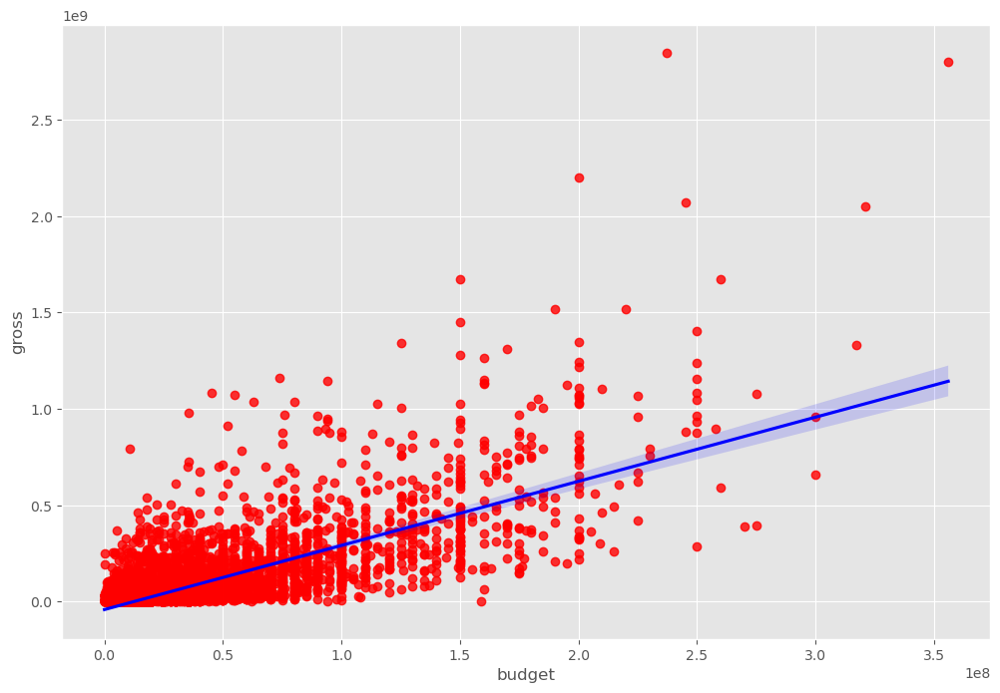

In [69]:
sns.regplot(y = "gross", x = "budget", data=df, scatter_kws={"color":"red"}, line_kws={"color":"blue"});

## Doing a Scatterplot with Gross and Budget

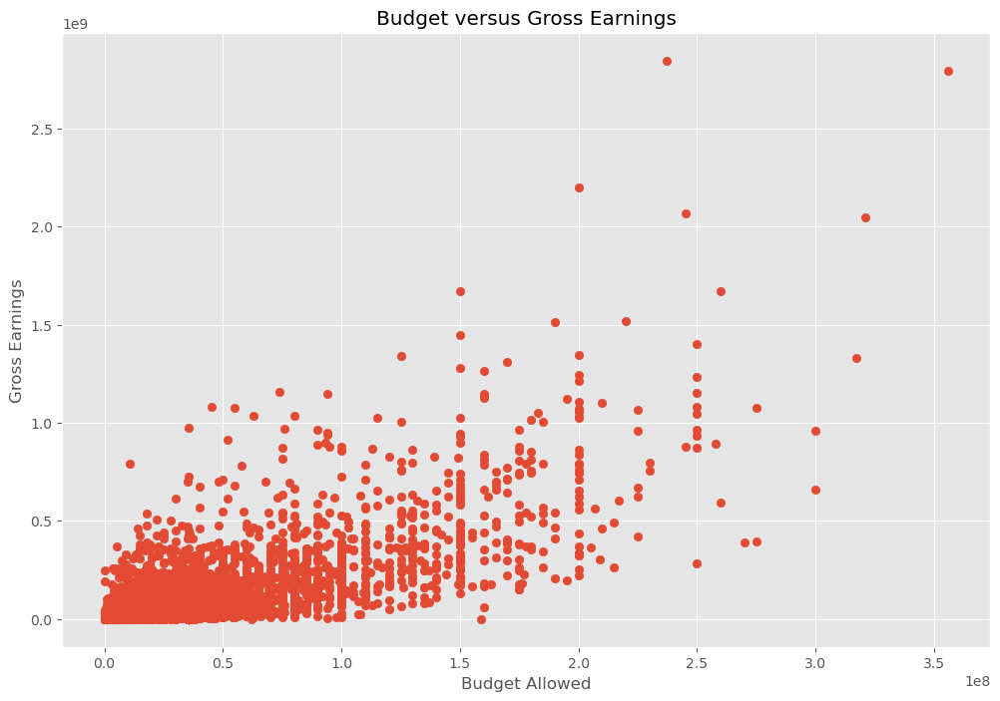

In [61]:
plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Budget versus Gross Earnings')
plt.xlabel('Budget Allowed')
plt.ylabel('Gross Earnings')
plt.show();

## Determining the correlations.

In [72]:
df.corr(numeric_only=True, method='pearson') # Other methods include kendall and spearman

,year,score,votes,budget,gross
year,1.000000,0.097936,0.222810,0.265578,0.257613
score,0.097936,1.000000,0.409182,0.064541,0.184919
votes,0.222810,0.409182,1.000000,0.421007,0.631385
budget,0.265578,0.064541,0.421007,1.000000,0.712529
gross,0.257613,0.184919,0.631385,0.712529,1.000000


##  Seems that there is a high Correlation between Budget and Gross Earnings and a reasonably high correlation between votes and gross

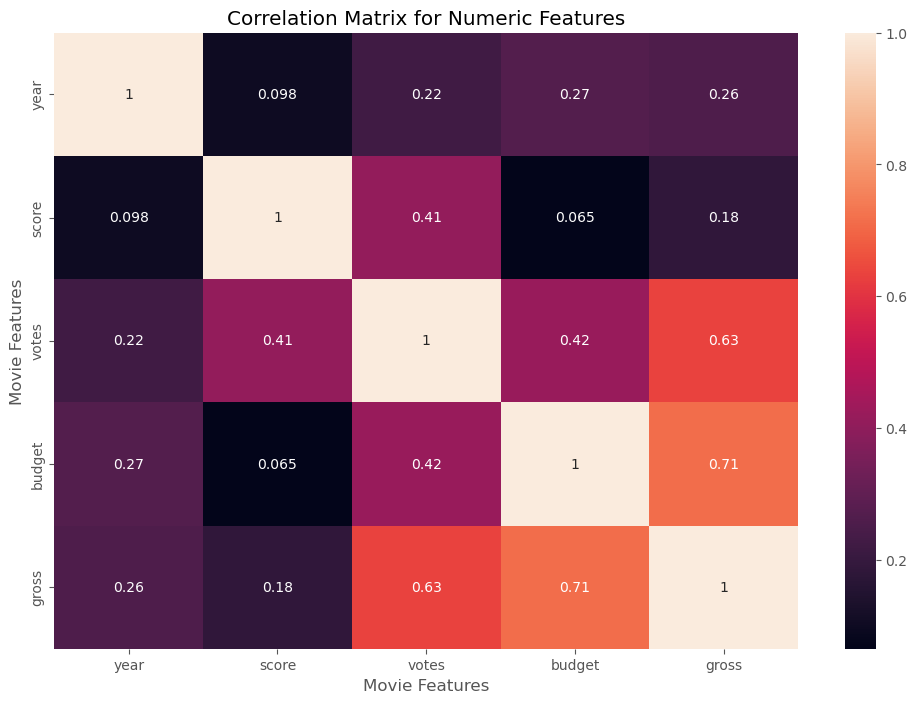

In [75]:
Correlation_matrix = df.corr(numeric_only=True, method='pearson')
sns.heatmap(Correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show();

In [78]:
df.dtypes

name         object
rating       object
genre        object
year          int64
score       float64
votes         int64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
dtype: object

## In order to determine correlations with other fields eg Company and Budget, we need to numerize all other object type fields

In [83]:
df_numerized = df

for col_name in df_numerized.columns:
    if df_numerized[col_name].dtype == 'object':
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company
0,6587,6,6,1980,8.400000,927000,2589,4014,1047,54,19000000,46998772,2320
1,5573,6,1,1980,5.800000,65000,2269,1632,327,55,4500000,58853106,731
2,5142,4,0,1980,8.700000,1200000,1111,2567,1745,55,18000000,538375067,1540
3,286,4,4,1980,7.700000,221000,1301,2000,2246,55,3500000,83453539,1812
4,1027,6,4,1980,7.300000,108000,1054,521,410,55,6000000,39846344,1777
5,2109,6,10,1980,6.400000,123000,2528,4363,241,55,550000,39754601,1812
6,5574,6,0,1980,7.900000,188000,1412,838,1277,55,27000000,115229890,2281
7,4436,6,3,1980,8.200000,330000,1829,1769,2240,55,18000000,23402427,631
8,5281,4,0,1980,6.800000,101000,2306,1979,877,55,54000000,108185706,883
9,6213,6,3,1980,7.000000,10000,2864,423,589,55,10000000,15795189,2272


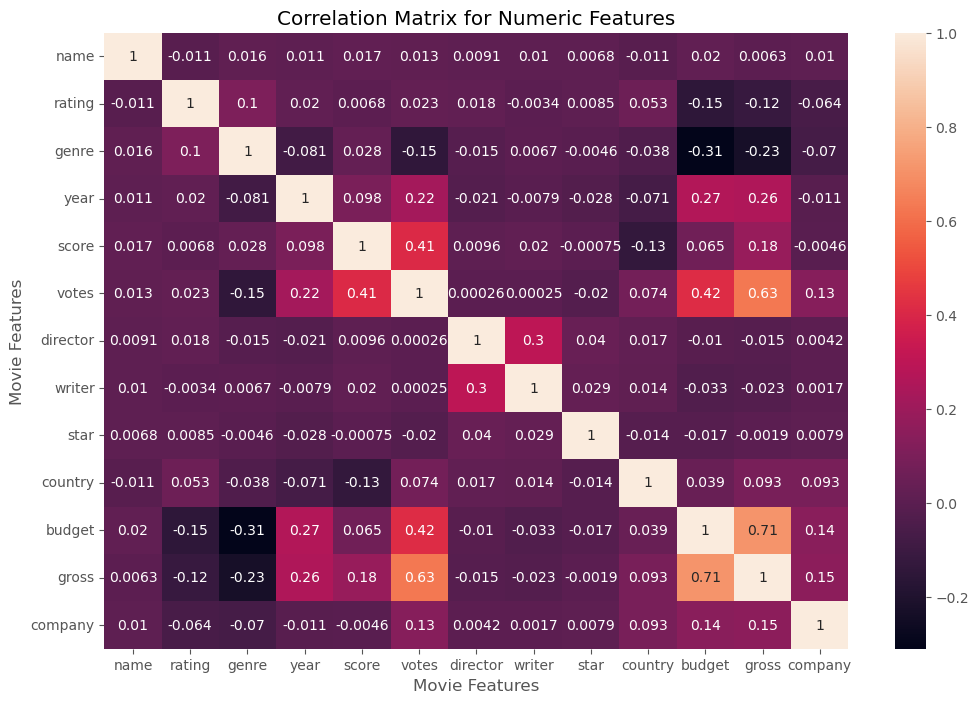

In [86]:
Correlation_matrix = df_numerized.corr(method='pearson')
sns.heatmap(Correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show();

In [87]:
df_numerized.corr()

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company
name,1.000000,-0.010860,0.016355,0.011453,0.017095,0.013086,0.009079,0.009985,0.006844,-0.010737,0.020368,0.006304,0.010373
rating,-0.010860,1.000000,0.104108,0.019913,0.006825,0.022813,0.018466,-0.003401,0.008469,0.053417,-0.148372,-0.120509,-0.064254
genre,0.016355,0.104108,1.000000,-0.081261,0.027959,-0.145276,-0.015258,0.006747,-0.004641,-0.037615,-0.310566,-0.232632,-0.070032
year,0.011453,0.019913,-0.081261,1.000000,0.097936,0.222810,-0.020795,-0.007930,-0.027912,-0.070938,0.265578,0.257613,-0.011425
score,0.017095,0.006825,0.027959,0.097936,1.000000,0.409182,0.009559,0.019787,-0.000754,-0.133343,0.064541,0.184919,-0.004584
votes,0.013086,0.022813,-0.145276,0.222810,0.409182,1.000000,0.000260,0.000252,-0.019510,0.073622,0.421007,0.631385,0.130659
director,0.009079,0.018466,-0.015258,-0.020795,0.009559,0.000260,1.000000,0.299523,0.039875,0.017490,-0.010364,-0.014635,0.004248
writer,0.009985,-0.003401,0.006747,-0.007930,0.019787,0.000252,0.299523,1.000000,0.028887,0.014488,-0.033223,-0.023082,0.001729
star,0.006844,0.008469,-0.004641,-0.027912,-0.000754,-0.019510,0.039875,0.028887,1.000000,-0.014234,-0.017056,-0.001940,0.007918
country,-0.010737,0.053417,-0.037615,-0.070938,-0.133343,0.073622,0.017490,0.014488,-0.014234,1.000000,0.039000,0.092955,0.092964


In [88]:
correlation_mat = df_numerized.corr()
corr_pairs =correlation_mat.unstack()
corr_pairs

name      name        1.000000
          rating     -0.010860
          genre       0.016355
          year        0.011453
          score       0.017095
          votes       0.013086
          director    0.009079
          writer      0.009985
          star        0.006844
          country    -0.010737
          budget      0.020368
          gross       0.006304
          company     0.010373
rating    name       -0.010860
          rating      1.000000
          genre       0.104108
          year        0.019913
          score       0.006825
          votes       0.022813
          director    0.018466
          writer     -0.003401
          star        0.008469
          country     0.053417
          budget     -0.148372
          gross      -0.120509
          company    -0.064254
genre     name        0.016355
          rating      0.104108
          genre       1.000000
          year       -0.081261
          score       0.027959
          votes      -0.145276
        

In [89]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

budget    genre      -0.310566
genre     budget     -0.310566
gross     genre      -0.232632
genre     gross      -0.232632
rating    budget     -0.148372
budget    rating     -0.148372
genre     votes      -0.145276
votes     genre      -0.145276
score     country    -0.133343
country   score      -0.133343
gross     rating     -0.120509
rating    gross      -0.120509
genre     year       -0.081261
year      genre      -0.081261
          country    -0.070938
country   year       -0.070938
genre     company    -0.070032
company   genre      -0.070032
          rating     -0.064254
rating    company    -0.064254
genre     country    -0.037615
country   genre      -0.037615
budget    writer     -0.033223
writer    budget     -0.033223
star      year       -0.027912
year      star       -0.027912
gross     writer     -0.023082
writer    gross      -0.023082
year      director   -0.020795
director  year       -0.020795
star      votes      -0.019510
votes     star       -0.019510
star    

In [91]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

votes     gross       0.631385
gross     votes       0.631385
budget    gross       0.712529
gross     budget      0.712529
name      name        1.000000
director  director    1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
gross     gross       1.000000
company   company     1.000000
dtype: float64